# Inspect Crop Training Data

Inspect and visualize data loading and pre-processing code.

In [2]:
import os
import sys
import itertools
import math
import logging
import json
import re
import random
import time
import concurrent.futures
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon
import imgaug
from imgaug import augmenters as iaa
    
# Import Mask RCNN
from cropmask.mrcnn import utils, visualize
from cropmask.mrcnn import model as modellib
from cropmask.mrcnn.model import log

# add module packages
from cropmask import model_configs, datasets, preprocess

%matplotlib inline 

In [3]:
# Comment out to reload imported modules if they change
%load_ext autoreload
%autoreload 2

## Configurations

In [4]:
# Use configuation from crop_mask.py, but override
# image resizing so we see the real sizes here
class NoResizeConfig(model_configs.LandsatConfig):
    IMAGE_RESIZE_MODE = "none"
    
config = NoResizeConfig(3)

## Notebook Preferences

In [5]:
def get_ax(rows=1, cols=1, size=20):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

## Dataset

The data should be in data/raw/*dataset-id*/train after running `python crop_mask.py preprocess`

In [5]:
# Load dataset
dataset = datasets.ImageDataset()
# The subset is the name of the sub-directory, such as stage1_train,
# stage1_test, ...etc. You can also use these special values:
#     train: loads stage1_train but excludes validation images
#     val: loads validation images from stage1_train. For a list
#          of validation images see crop_mask.py
dataset.load_imagery(pp.DATASET, subset="train", image_source='landsat', class_name="center-pivot")

# Must call before using the dataset
dataset.prepare()

print("Image Count: {}".format(len(dataset.image_ids)))
print("Class Count: {}".format(dataset.num_classes))
for i, info in enumerate(dataset.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Image Count: 106
Class Count: 2
  0. BG                                                
  1. center-pivot                                      


## Display Samples 
http://scikit-image.org/docs/dev/auto_examples/color_exposure/plot_equalize.html

These bad cps are tough to fix. Can't import tifs into qgis, opening doesn't fix all the cps. will revist if model trianing/detection is especially bad. I could seperate these into my test folder and only train on good circles. These are in the center pivot directory, need to change paths or delete this old cell

/home/rave/tana-crunch/waves/cropmask/data/landsat-1024-cp-nobaddata/train/691370036/image/691370036.tif
(512, 512, 1)


<Figure size 1008x1008 with 0 Axes>

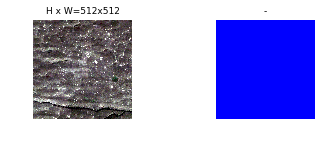

/home/rave/tana-crunch/waves/cropmask/data/landsat-1024-cp-nobaddata/train/991244035/image/991244035.tif
(512, 512, 68)


<Figure size 1008x1008 with 0 Axes>

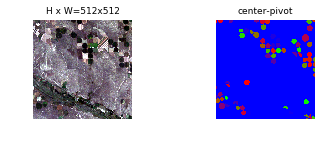

/home/rave/tana-crunch/waves/cropmask/data/landsat-1024-cp-nobaddata/train/702753419/image/702753419.tif
(512, 512, 1)


<Figure size 1008x1008 with 0 Axes>

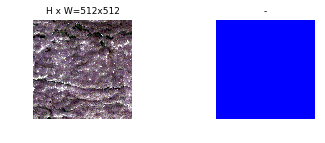

In [6]:
# Load and display random samples
image_ids = np.random.choice(dataset.image_ids, 3)
for image_id in image_ids:
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    print(dataset.source_image_link(image_id))
    print(mask.shape)
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names, limit=1)

Works, but still need to find better RGB stretching method. Stretching is applied in mrcnn/visualize.py with skimage.exposure

molded_image             shape: (512, 512, 3)         min:   20.94380  max:  255.00000  float32
mask                     shape: (512, 512, 56)        min:    0.00000  max:    1.00000  bool


/opt/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


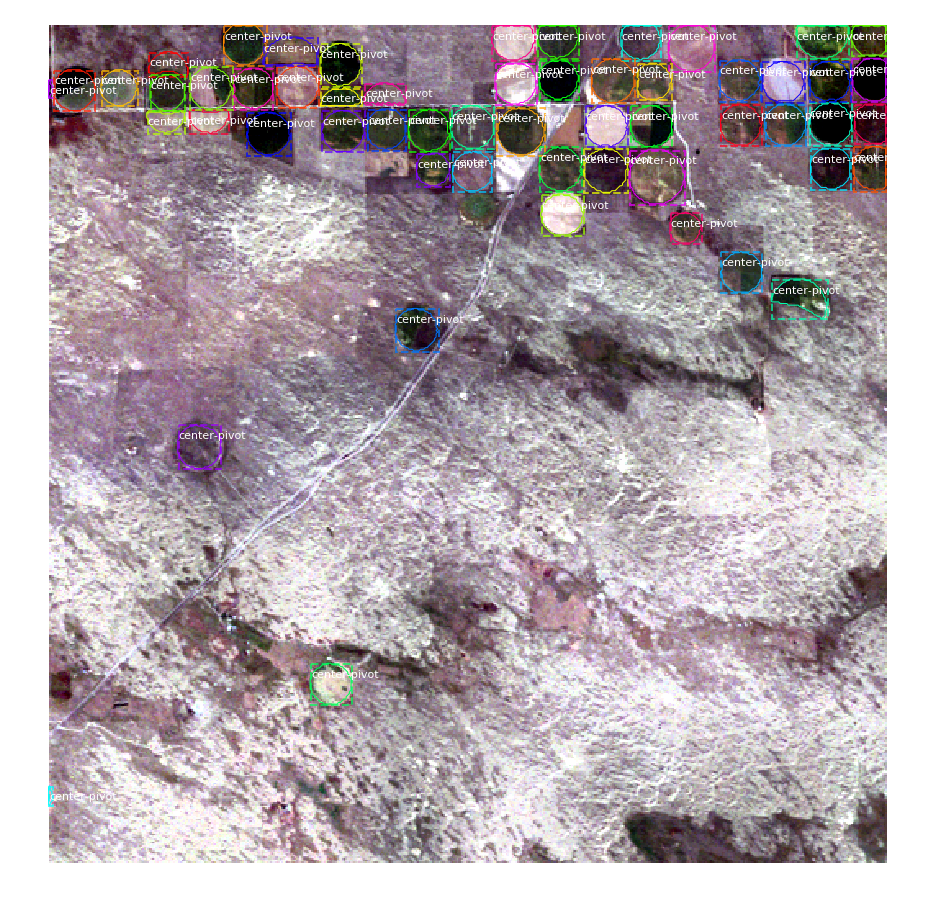

In [7]:
# Example of loading a specific image by its source ID get id from above or from train folder
source_id = "338039615"

# Map source ID to Dataset image_id
# Notice the prefix: it's the name given to the dataset in the Dataset class
image_id = dataset.image_from_source_map["landsat.{}".format(source_id)]

# Load and display
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
        dataset, config, image_id, use_mini_mask=False)
image = image.astype(np.float32) # for landsat only
image *= (255.0/image.max()) # for landsat only
log("molded_image", image)
log("mask", mask)
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names,
                            show_bbox=True)

## Dataset Stats

Loop through all images in the dataset and collect aggregate stats.

In [8]:
def image_stats(image_id):
    """Returns a dict of stats for one image."""
    image = dataset.load_image(image_id)
    mask, _ = dataset.load_mask(image_id)
    bbox = utils.extract_bboxes(mask)
    # Sanity check
    assert mask.shape[:2] == image.shape[:2]
    # Return stats dict
    return {
        "id": image_id,
        "shape": list(image.shape),
        "bbox": [[b[2] - b[0], b[3] - b[1]]
                 for b in bbox
                 # Uncomment to exclude fields with 1 pixel width
                 # or height (often on edges)
                 if b[2] - b[0] > 1 and b[3] - b[1] > 1
                ],
        "color": np.mean(image, axis=(0, 1)),
    }

# Loop through the dataset and compute stats over multiple threads
# This might take a few minutes
t_start = time.time()
with concurrent.futures.ThreadPoolExecutor() as e:
    stats = list(e.map(image_stats, dataset.image_ids))
t_total = time.time() - t_start
print("Total time: {:.1f} seconds".format(t_total))

Total time: 8.4 seconds


### Image Size Stats

Image Count:  106
Height  mean: 512.00  median: 512.00  min: 512.00  max: 512.00
Width   mean: 512.00  median: 512.00  min: 512.00  max: 512.00
Color   mean (RGB): 712.94 1007.69 1162.11


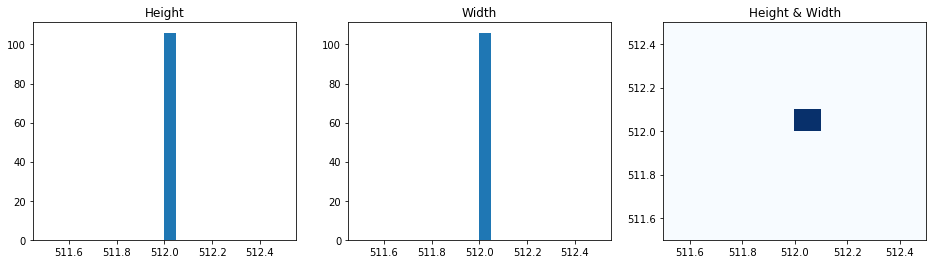

In [9]:
# Image stats
image_shape = np.array([s['shape'] for s in stats])
image_color = np.array([s['color'] for s in stats])
print("Image Count: ", image_shape.shape[0])
print("Height  mean: {:.2f}  median: {:.2f}  min: {:.2f}  max: {:.2f}".format(
    np.mean(image_shape[:, 0]), np.median(image_shape[:, 0]),
    np.min(image_shape[:, 0]), np.max(image_shape[:, 0])))
print("Width   mean: {:.2f}  median: {:.2f}  min: {:.2f}  max: {:.2f}".format(
    np.mean(image_shape[:, 1]), np.median(image_shape[:, 1]),
    np.min(image_shape[:, 1]), np.max(image_shape[:, 1])))
print("Color   mean (RGB): {:.2f} {:.2f} {:.2f}".format(*np.mean(image_color, axis=0)))

# Histograms
fig, ax = plt.subplots(1, 3, figsize=(16, 4))
ax[0].set_title("Height")
_ = ax[0].hist(image_shape[:, 0], bins=20)
ax[1].set_title("Width")
_ = ax[1].hist(image_shape[:, 1], bins=20)
ax[2].set_title("Height & Width")
_ = ax[2].hist2d(image_shape[:, 1], image_shape[:, 0], bins=10, cmap="Blues")

### Fields per Image Stats

Fields/Image
For Image area <= 1024**2:  mean: 30.1  median: 12.5  min: 0.0  max: 203.0


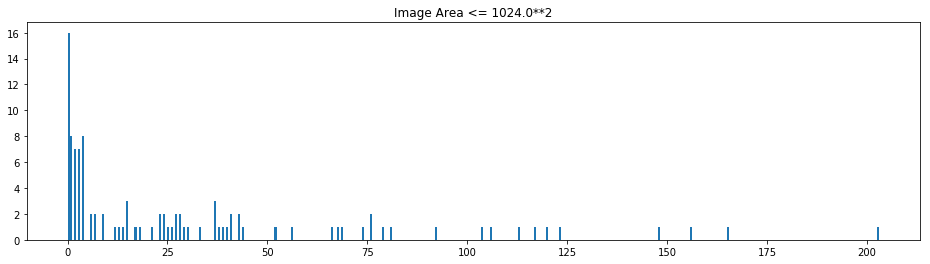

In [10]:
# Segment by image area, edited to only work with one area threshold, for loop not needed but doesn't hurt
image_area_bins = [1024**2]

print("Fields/Image")
fig, ax = plt.subplots(1, len(image_area_bins), figsize=(16, 4))
area_threshold = 0
for i, image_area in enumerate(image_area_bins):
    fields_per_image = np.array([len(s['bbox']) 
                                 for s in stats 
                                 if area_threshold < (s['shape'][0] * s['shape'][1]) <= image_area])
    area_threshold = image_area
    if len(fields_per_image) == 0:
        print("For Image area <= {:4}**2: None".format(np.sqrt(image_area)))
        continue
    print("For Image area <= {:4.0f}**2:  mean: {:.1f}  median: {:.1f}  min: {:.1f}  max: {:.1f}".format(
        np.sqrt(image_area), fields_per_image.mean(), np.median(fields_per_image), 
        fields_per_image.min(), fields_per_image.max()))
    ax.set_title("Image Area <= {:4}**2".format(np.sqrt(image_area)))
    _ = ax.hist(fields_per_image, bins=400)

## Need to filter out masks that are super small

### Field Size Stats

{'id': 0, 'shape': [512, 512, 3], 'bbox': [[25, 13], [34, 27], [23, 23], [25, 15], [14, 3], [24, 25], [11, 22], [38, 37], [26, 27], [25, 26], [24, 11], [24, 25], [25, 24], [25, 24], [24, 24], [21, 21], [24, 23], [24, 24], [23, 23], [24, 23], [25, 25], [23, 11], [19, 19], [25, 25], [24, 25], [25, 25], [12, 23], [23, 23], [21, 21], [7, 15], [25, 24], [16, 17], [24, 24], [24, 24], [24, 24], [23, 23], [24, 24], [24, 25], [25, 25], [25, 7], [27, 26], [26, 26], [24, 24], [21, 21], [23, 23], [27, 28], [27, 27], [16, 24], [30, 29], [23, 23], [22, 21], [20, 6], [36, 36], [20, 20], [23, 23], [11, 25], [15, 15], [25, 24], [19, 19], [23, 23], [12, 25], [13, 21], [23, 23], [24, 24], [23, 12], [3, 10], [17, 22], [25, 25], [25, 26], [24, 25], [33, 17], [24, 24], [26, 26], [24, 24], [25, 24], [20, 21], [20, 20], [24, 24], [26, 26], [26, 25], [25, 24], [32, 32], [25, 24], [13, 28], [14, 24], [24, 23], [7, 20], [22, 22], [26, 15], [11, 24], [29, 29], [24, 25], [23, 23], [13, 26], [25, 24], [23, 23], [26

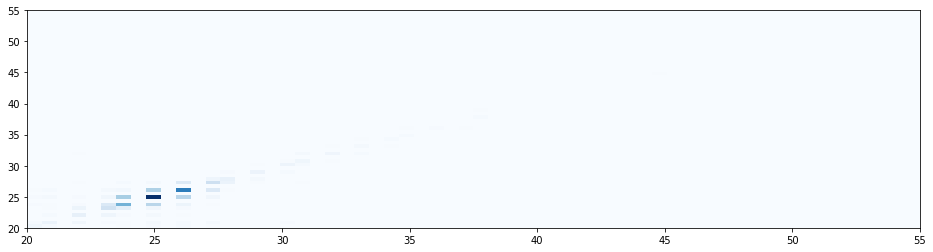

In [11]:
# Fields size stats
fig, ax = plt.subplots(1, len(image_area_bins), figsize=(16, 4))
area_threshold = 0
for i, image_area in enumerate(image_area_bins):
    field_shape = np.array([
        b
        for s in stats if area_threshold < (s['shape'][0] * s['shape'][1]) <= image_area
        for b in s['bbox']])
    print(stats[0])
    field_area = field_shape[:, 0] * field_shape[:, 1]
    area_threshold = image_area

    print("\nImage Area <= {:.0f}**2 units are in pixels".format(np.sqrt(image_area)))
    print("  Total Fields: ", field_shape.shape[0])
    print("  field Height. mean: {:.2f}  median: {:.2f}  min: {:.2f}  max: {:.2f}".format(
        np.mean(field_shape[:, 0]), np.median(field_shape[:, 0]),
        np.min(field_shape[:, 0]), np.max(field_shape[:, 0])))
    print("  field Width.  mean: {:.2f}  median: {:.2f}  min: {:.2f}  max: {:.2f}".format(
        np.mean(field_shape[:, 1]), np.median(field_shape[:, 1]),
        np.min(field_shape[:, 1]), np.max(field_shape[:, 1])))
    print("  field Area.   mean: {:.2f}  median: {:.2f}  min: {:.2f}  max: {:.2f}".format(
        np.mean(field_area), np.median(field_area),
        np.min(field_area), np.max(field_area)))

    # Show 2D histogram
    _ = ax.hist2d(field_shape[:, 1], field_shape[:, 0], bins=60, cmap="Blues", range = [[20,55],[20,55]])

field Aspect Ratio.  mean: 1.10  median: 1.00  min: 0.09  max: 7.00


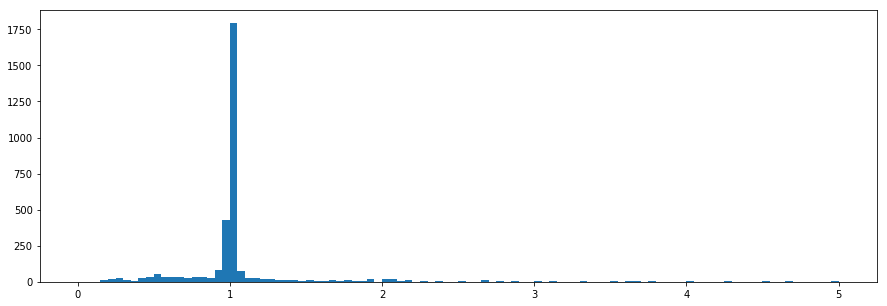

In [12]:
# Fields height/width ratio
field_aspect_ratio = field_shape[:, 0] / field_shape[:, 1]
print("field Aspect Ratio.  mean: {:.2f}  median: {:.2f}  min: {:.2f}  max: {:.2f}".format(
    np.mean(field_aspect_ratio), np.median(field_aspect_ratio),
    np.min(field_aspect_ratio), np.max(field_aspect_ratio)))
plt.figure(figsize=(15, 5))
_ = plt.hist(field_aspect_ratio, bins=100, range=[0, 5])

## Image Augmentation

Test out different augmentation methods

In [13]:
# List of augmentations
# http://imgaug.readthedocs.io/en/latest/source/augmenters.html
augmentation = iaa.Sometimes(.9,[
    iaa.Fliplr(0.5),
    iaa.Flipud(0.5),
    iaa.GaussianBlur(sigma=(0.1, 2.0)),
#     iaa.AdditiveGaussianNoise(scale=0.9)
])

/opt/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))
/opt/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))
/opt/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))
/opt/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


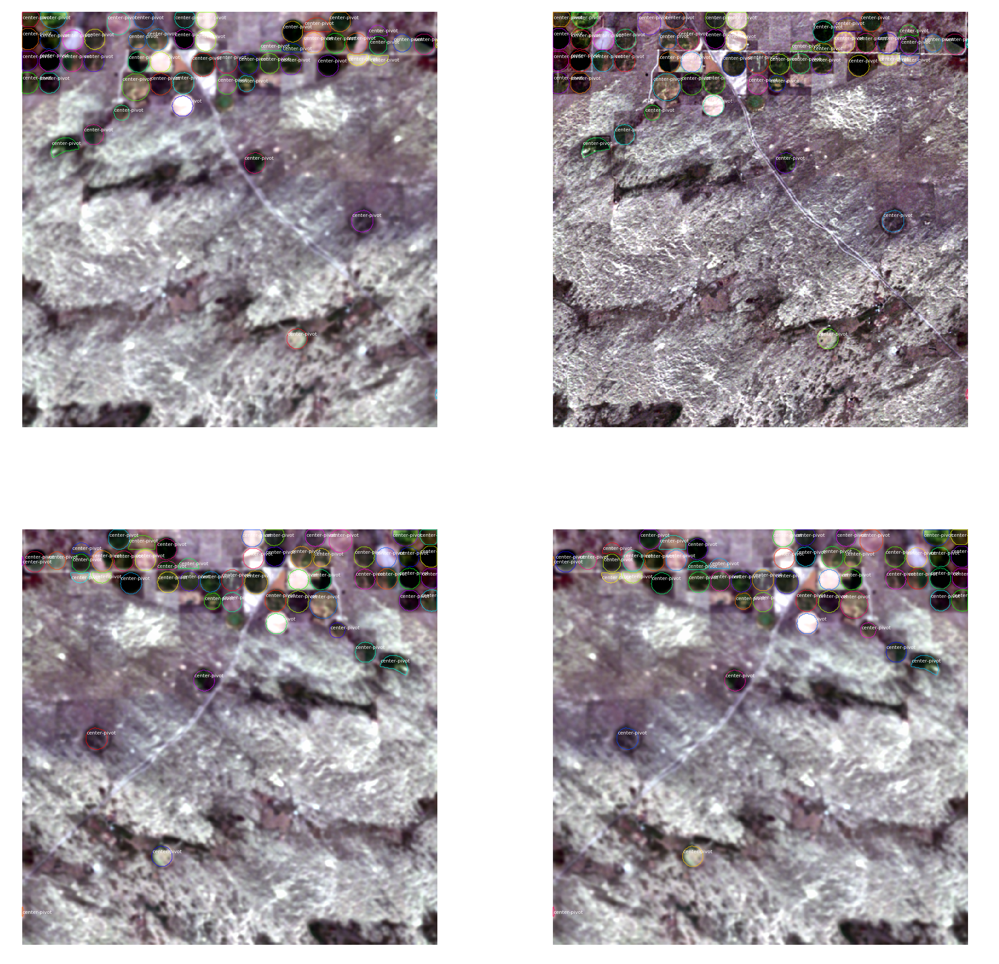

In [14]:
# Load the image multiple times to show augmentations
limit = 4
ax = get_ax(rows=2, cols=limit//2)
for i in range(limit):
    image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
        dataset, config, image_id, use_mini_mask=False, augment=False, augmentation=augmentation)
    visualize.display_instances(image, bbox, mask, class_ids,
                                dataset.class_names, ax=ax[i//2, i % 2],
                                show_mask=False, show_bbox=False)

## Image Crops

Our gridded images are small (about 260x260) so we probably don't need to crop them before hand. 

In [15]:
class RandomCropConfig(model_configs.LandsatConfig):
    IMAGE_RESIZE_MODE = "crop"
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512

crop_config = RandomCropConfig(3)


*** No instances to display *** 



/opt/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))



*** No instances to display *** 



/opt/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))



*** No instances to display *** 



/opt/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))



*** No instances to display *** 



/opt/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


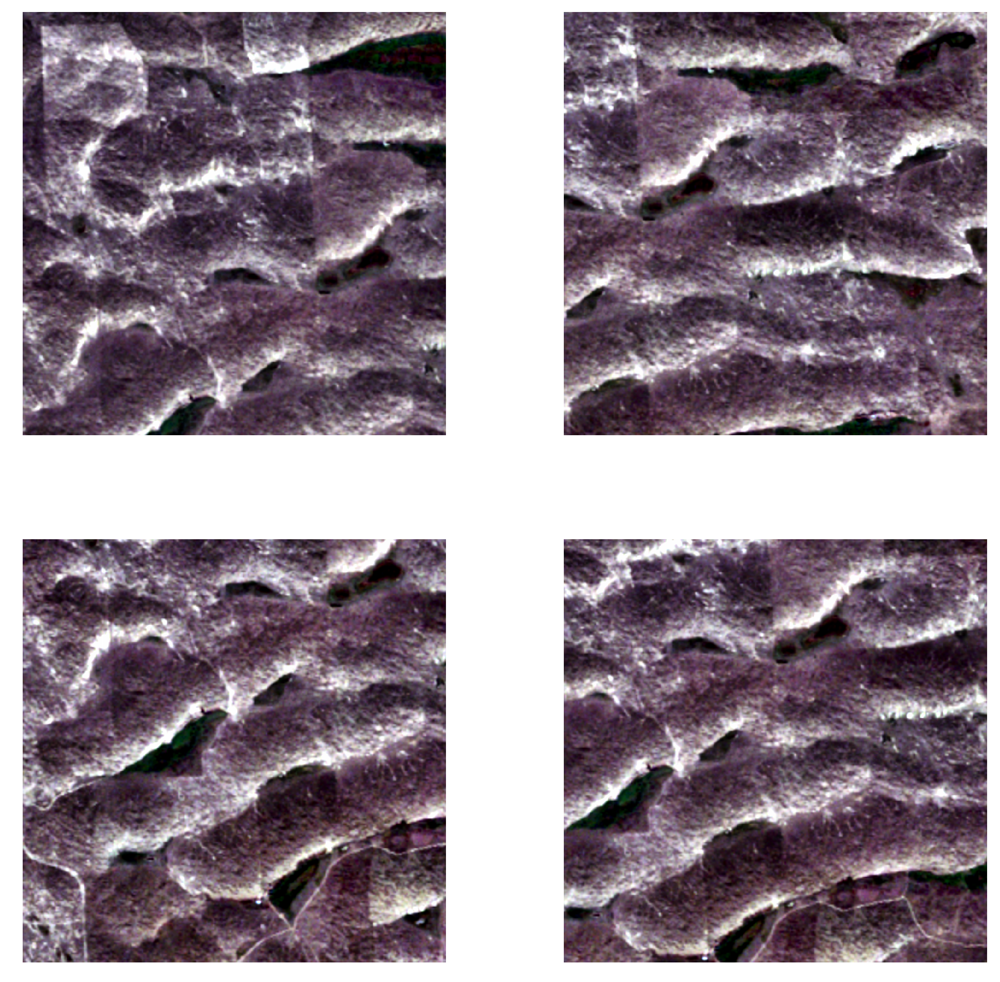

In [16]:
# Load the image multiple times to show augmentations
limit = 4
image_id = np.random.choice(dataset.image_ids, 1)[0]
ax = get_ax(rows=2, cols=limit//2)
for i in range(limit):
    image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
        dataset, crop_config, image_id, use_mini_mask=False)
    visualize.display_instances(image, bbox, mask, class_ids,
                                dataset.class_names, ax=ax[i//2, i % 2],
                                show_mask=False, show_bbox=False)

## Mini Masks
Below is the decription for the nucleus dataset. Since field size on average is about 78x78 and there are still quite a few fields that are larger, it is probably best not to optimize with mini masks, especially since our gridded images are noth that large - 256x256.

Instance binary masks can get large when training with high resolution images. For example, if training with 1024x1024 image then the mask of a single instance requires 1MB of memory (Numpy uses bytes for boolean values). If an image has 100 instances then that's 100MB for the masks alone. 

To improve training speed, we optimize masks:
* We store mask pixels that are inside the object bounding box, rather than a mask of the full image. Most objects are small compared to the image size, so we save space by not storing a lot of zeros around the object.
* We resize the mask to a smaller size (e.g. 56x56). For objects that are larger than the selected size we lose a bit of accuracy. But most object annotations are not very accuracy to begin with, so this loss is negligable for most practical purposes. Thie size of the mini_mask can be set in the config class.

To visualize the effect of mask resizing, and to verify the code correctness, we visualize some examples.

image_id:  63 None
Original shape:  (512, 512, 3)
image                    shape: (512, 512, 3)         min:  191.00000  max: 2912.00000  int16
mask                     shape: (512, 512, 124)       min:    0.00000  max:    1.00000  bool
class_ids                shape: (124,)                min:    1.00000  max:    1.00000  int32
bbox                     shape: (124, 4)              min:    0.00000  max:  512.00000  int32


/opt/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


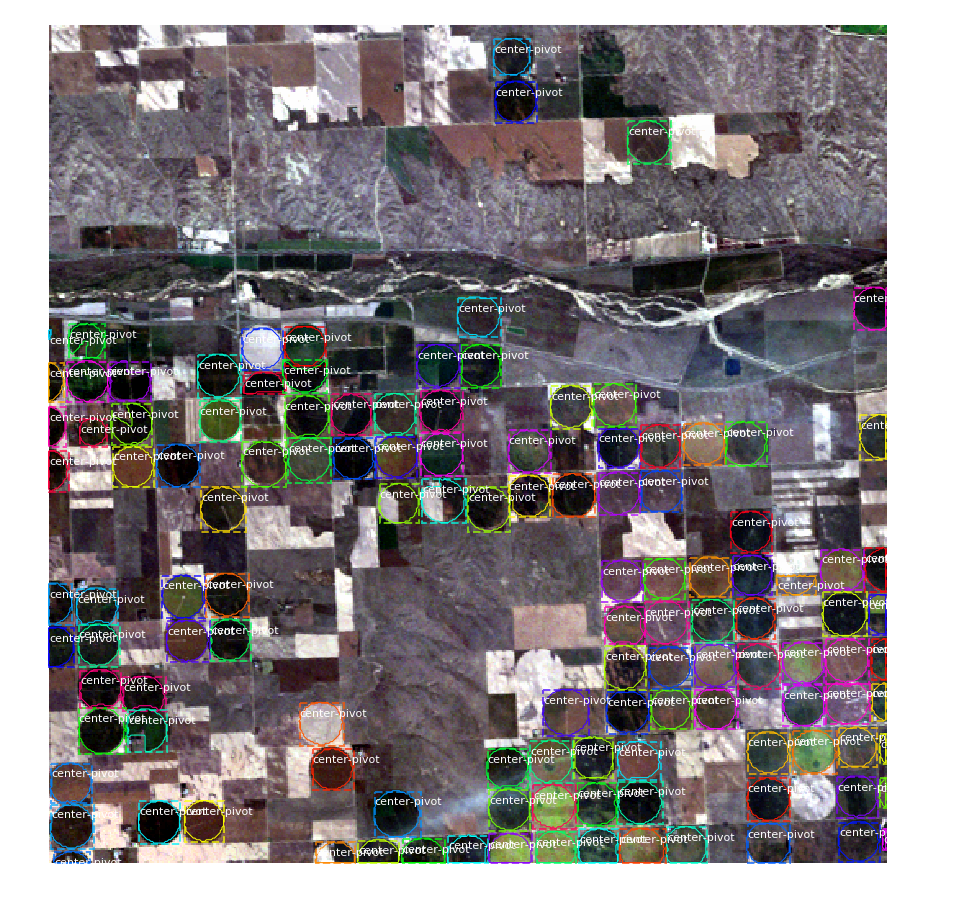

In [17]:
# Load random image and mask.
image_id = np.random.choice(dataset.image_ids, 1)[0]
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
original_shape = image.shape
# Resize
image, window, scale, padding, _ = utils.resize_image(
    image, 
    min_dim=config.IMAGE_MIN_DIM, 
    max_dim=config.IMAGE_MAX_DIM,
    mode=config.IMAGE_RESIZE_MODE)
mask = utils.resize_mask(mask, scale, padding)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id: ", image_id, dataset.image_reference(image_id))
print("Original shape: ", original_shape)
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

fails for images with no fields

image                    shape: (512, 512, 3)         min:  237.00000  max: 2955.00000  int16
image_meta               shape: (14,)                 min:    0.00000  max:  512.00000  int64
class_ids                shape: (27,)                 min:    1.00000  max:    1.00000  int32
bbox                     shape: (27, 4)               min:    0.00000  max:  512.00000  int32
mask                     shape: (512, 512, 27)        min:    0.00000  max:    1.00000  bool


<Figure size 1008x720 with 0 Axes>

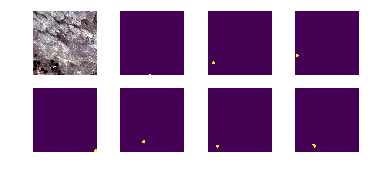

In [18]:
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id, use_mini_mask=False)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

/opt/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


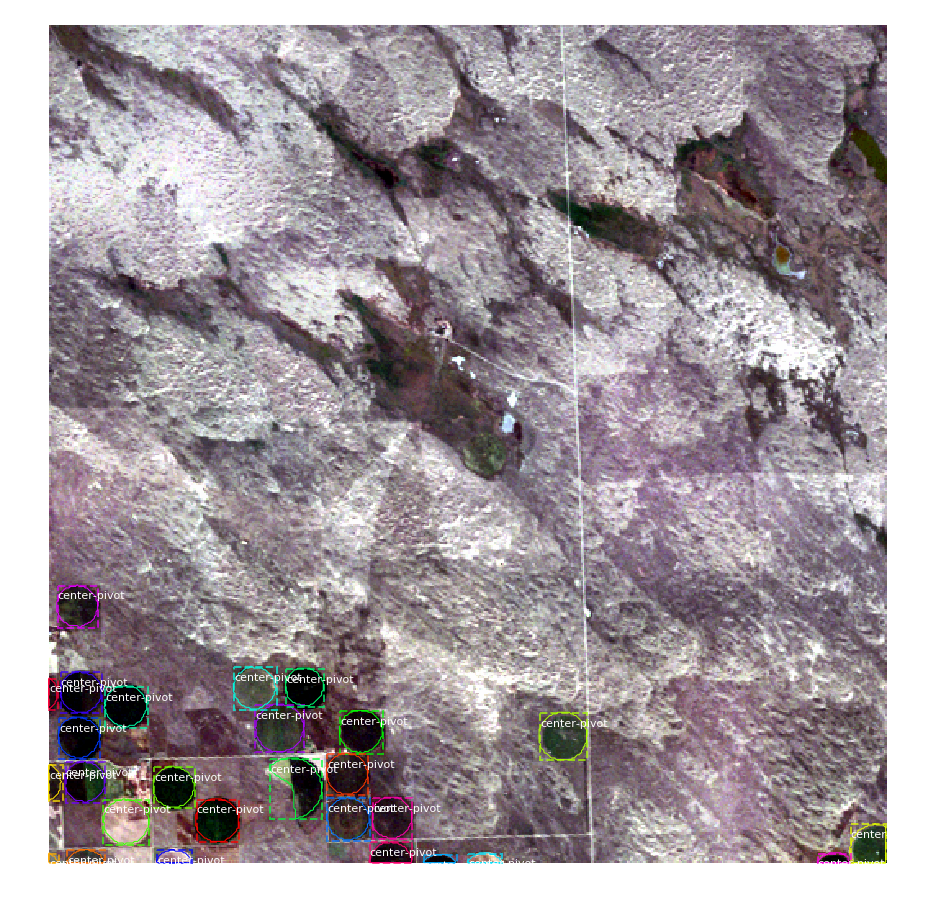

<Figure size 432x288 with 0 Axes>

In [19]:
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)
import matplotlib.pyplot as plt
plt.savefig("/home/rave/cloudy_landsat_scene_example_with_missing_label_diff_sizes.png")

mask                     shape: (56, 56, 27)          min:    0.00000  max:    1.00000  bool


<Figure size 1008x720 with 0 Axes>

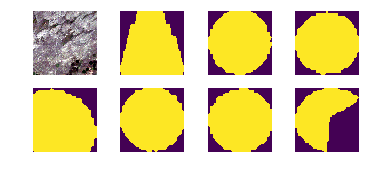

In [20]:
# Add augmentation and mask resizing.
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id, augment=True, use_mini_mask=True)
log("mask", mask)
display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

/opt/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


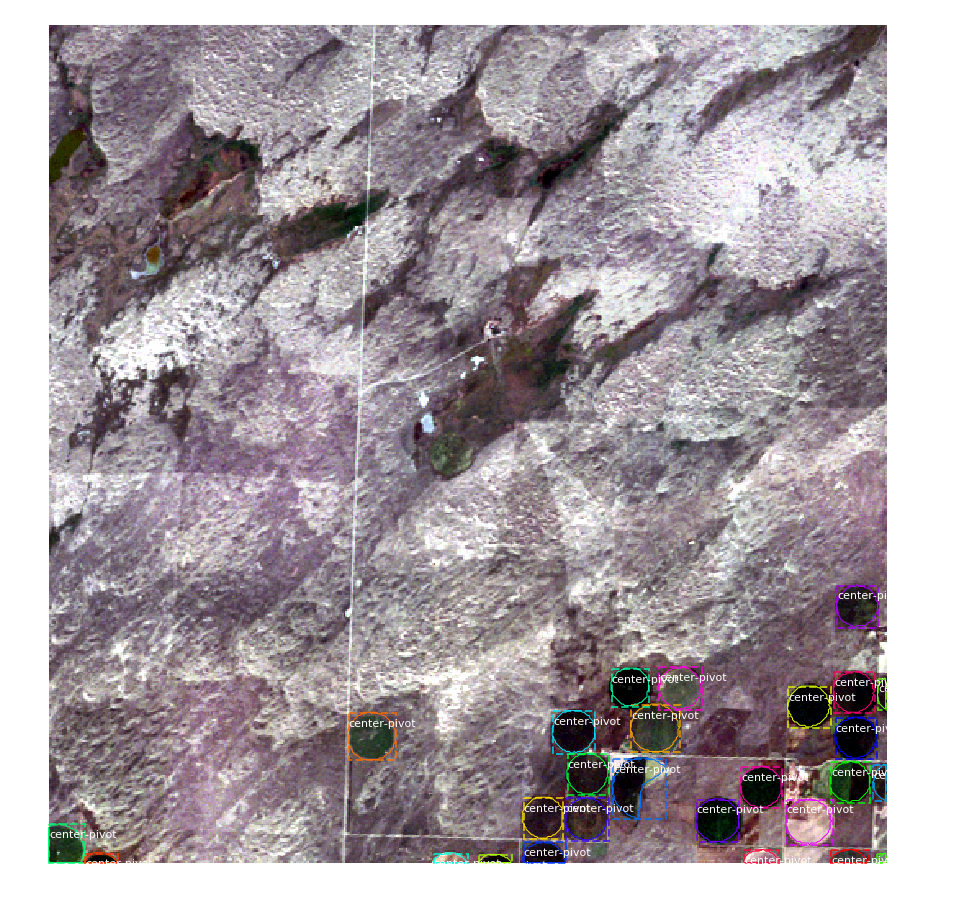

In [21]:
mask = utils.expand_mask(bbox, mask, image.shape)
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

## Anchors

For an FPN network, the anchors must be ordered in a way that makes it easy to match anchors to the output of the convolution layers that predict anchor scores and shifts. 
* Sort by pyramid level first. All anchors of the first level, then all of the second and so on. This makes it easier to separate anchors by level.
* Within each level, sort anchors by feature map processing sequence. Typically, a convolution layer processes a feature map starting from top-left and moving right row by row. 
* For each feature map cell, pick any sorting order for the anchors of different ratios. Here we match the order of ratios passed to the function.

In [22]:
# this functionality has been moved to mrcnn/visualize.py, keeping for now for interactive plotting
import skimage.io as skio
from skimage import exposure

def normalize(x):
    """
    Normalize a list of sample image data in the range of 0 to 1
    : x: List of image data.  The image shape is (32, 32, 3)
    : return: Numpy array of normalized data
    """
    return np.array((x - np.min(x)) / (np.max(x) - np.min(x)))

def reorder_to_brg(image):
    '''reorders landsat bands ordered like RGB for off/onseason
    to blue, red, green for imshow
    '''
    blue = normalize(image[:,:,0])
    green = normalize(image[:,:,1])
    red = normalize(image[:,:,2])
    return np.stack([red, green, blue], axis=-1)

def percentile_rescale(arr):
    '''
    Rescales and applies other exposure functions to improve image vis. 
    http://scikit-image.org/docs/dev/api/skimage.exposure.html#skimage.exposure.rescale_intensity
    '''
    rescaled_arr = np.zeros_like(arr)
    for i in range(0,arr.shape[-1]):
        val_range = (np.percentile(arr[:,:,i], 2), np.percentile(arr[:,:,i], 98))
        rescaled_channel = exposure.rescale_intensity(arr[:,:,i], val_range)
        rescaled_arr[:,:,i] = rescaled_channel
        #rescaled_arr= exposure.adjust_gamma(rescaled_arr, gamma=1) #adjust from 1 either way
#     rescaled_arr= exposure.adjust_sigmoid(rescaled_arr, cutoff=.50) #adjust from .5 either way  
    return rescaled_arr

In [23]:
model_configs.LandsatConfig.RPN_ANCHOR_SCALES

(32, 64, 128)

Count:  64512
Scales:  (32, 64, 128)
ratios:  [0.5, 1, 2]
Anchors per Cell:  3
Levels:  5
Anchors in Level 0: 49152
Anchors in Level 1: 12288
Anchors in Level 2: 3072
Anchors in Level 3: 768
Anchors in Level 4: 192


/opt/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


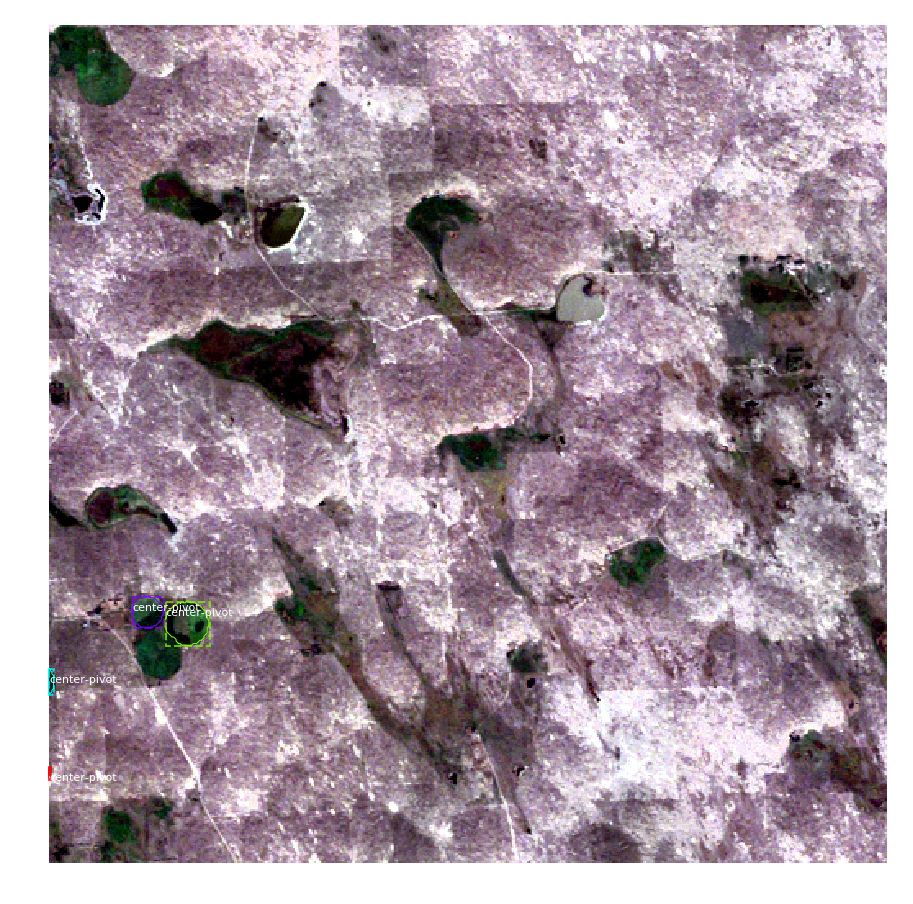

Level 0. Anchors:  49152  Feature map Shape: [128 128]
Level 1. Anchors:  12288  Feature map Shape: [64 64]
Level 2. Anchors:   3072  Feature map Shape: [32 32]
Level 3. Anchors:      0  Feature map Shape: [16 16]
Level 4. Anchors:      0  Feature map Shape: [8 8]


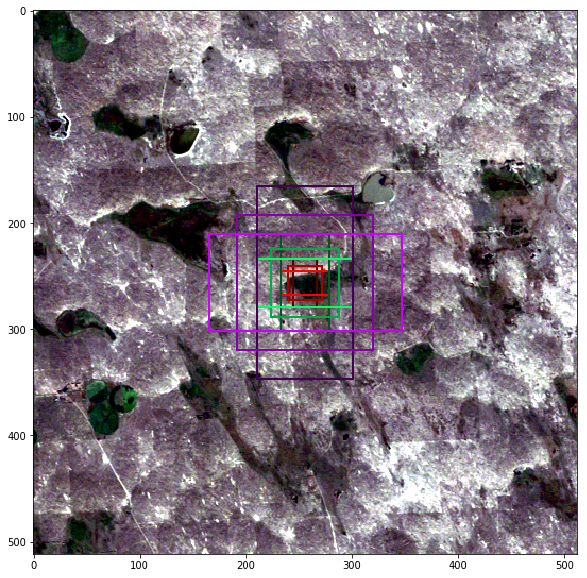

In [24]:
## Visualize anchors of one cell at the center of the feature map

# Load and display random image
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(dataset, model_configs.LandsatConfig, image_id)

# Generate Anchors
config= model_configs.LandsatConfig
backbone_shapes = modellib.compute_backbone_shapes(config, image.shape)
anchors = utils.generate_pyramid_anchors(config.RPN_ANCHOR_SCALES, 
                                          config.RPN_ANCHOR_RATIOS,
                                          backbone_shapes,
                                          config.BACKBONE_STRIDES, 
                                          config.RPN_ANCHOR_STRIDE)

# Print summary of anchors
num_levels = len(backbone_shapes)
anchors_per_cell = len(config.RPN_ANCHOR_RATIOS)
print("Count: ", anchors.shape[0])
print("Scales: ", config.RPN_ANCHOR_SCALES)
print("ratios: ", config.RPN_ANCHOR_RATIOS)
print("Anchors per Cell: ", anchors_per_cell)
print("Levels: ", num_levels)
anchors_per_level = []
for l in range(num_levels):
    num_cells = backbone_shapes[l][0] * backbone_shapes[l][1]
    anchors_per_level.append(anchors_per_cell * num_cells // config.RPN_ANCHOR_STRIDE**2)
    print("Anchors in Level {}: {}".format(l, anchors_per_level[l]))

# Display
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)
fig, ax = plt.subplots(1, figsize=(10, 10))
image = reorder_to_brg(image)
# image = exposure.equalize_adapthist(image, clip_limit=0.0055)
image = percentile_rescale(image)
ax.imshow(image, vmin=5)
levels = len(backbone_shapes)

for level in range(levels):
    colors = visualize.random_colors(levels)
    # Compute the index of the anchors at the center of the image
    level_start = sum(anchors_per_level[:level]) # sum of anchors of previous levels
    level_anchors = anchors[level_start:level_start+anchors_per_level[level]]
    print("Level {}. Anchors: {:6}  Feature map Shape: {}".format(level, level_anchors.shape[0], 
                                                                backbone_shapes[level]))
    center_cell = backbone_shapes[level] // 2
    center_cell_index = (center_cell[0] * backbone_shapes[level][1] + center_cell[1])
    level_center = center_cell_index * anchors_per_cell 
    center_anchor = anchors_per_cell * (
        (center_cell[0] * backbone_shapes[level][1] / config.RPN_ANCHOR_STRIDE**2) \
        + center_cell[1] / config.RPN_ANCHOR_STRIDE)
    level_center = int(center_anchor)

    # Draw anchors. Brightness show the order in the array, dark to bright.
    for i, rect in enumerate(level_anchors[level_center:level_center+anchors_per_cell]):
        y1, x1, y2, x2 = rect
        p = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, facecolor='none',
                              edgecolor=(i+1)*np.array(colors[level]) / anchors_per_cell)
        ax.add_patch(p)


## Data Generator

In [44]:
# Create data generator
random_rois = 2000
g = modellib.data_generator(
    dataset, crop_config, shuffle=True, random_rois=random_rois, 
    batch_size=4,
    detection_targets=True)

In [26]:
# Uncomment to run the generator through a lot of images
# to catch rare errors
# for i in range(1000):
#     print(i)
#     _, _ = next(g)

In [45]:
# Get Next Image
if random_rois:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_class_ids, gt_boxes, gt_masks, rpn_rois, rois], \
    [mrcnn_class_ids, mrcnn_bbox, mrcnn_mask] = next(g)
    
    log("rois", rois)
    log("mrcnn_class_ids", mrcnn_class_ids)
    log("mrcnn_bbox", mrcnn_bbox)
    log("mrcnn_mask", mrcnn_mask)
else:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_boxes, gt_masks], _ = next(g)
    
log("gt_class_ids", gt_class_ids)
log("gt_boxes", gt_boxes)
log("gt_masks", gt_masks)
log("rpn_match", rpn_match, )
log("rpn_bbox", rpn_bbox)
image_id = modellib.parse_image_meta(image_meta)["image_id"][0]
print("image_id: ", image_id, dataset.image_reference(image_id))

# Remove the last dim in mrcnn_class_ids. It's only added
# to satisfy Keras restriction on target shape.
mrcnn_class_ids = mrcnn_class_ids[:,:,0]

rois                     shape: (4, 200, 4)           min:    0.00000  max:  511.00000  int32
mrcnn_class_ids          shape: (4, 200, 1)           min:    0.00000  max:    1.00000  int32
mrcnn_bbox               shape: (4, 200, 2, 4)        min:   -3.01317  max:    2.70833  float32
mrcnn_mask               shape: (4, 200, 28, 28, 2)   min:    0.00000  max:    1.00000  float32
gt_class_ids             shape: (4, 203)              min:    0.00000  max:    1.00000  int32
gt_boxes                 shape: (4, 203, 4)           min:    0.00000  max:  512.00000  int32
gt_masks                 shape: (4, 56, 56, 203)      min:    0.00000  max:    1.00000  bool
rpn_match                shape: (4, 64512, 1)         min:   -1.00000  max:    1.00000  int32
rpn_bbox                 shape: (4, 64, 4)            min:   -4.08289  max:    3.97748  float64
image_id:  54 None


not showing true color for some reason, due to normalization in cell above?

anchors                  shape: (64512, 4)            min:  -90.50967  max:  586.50967  float64
refined_anchors          shape: (18, 4)               min:    0.00000  max:  512.00000  float32
Positive anchors: 18
Negative anchors: 46
Neutral anchors: 64448
BG                     : 173
center-pivot           : 27


/opt/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


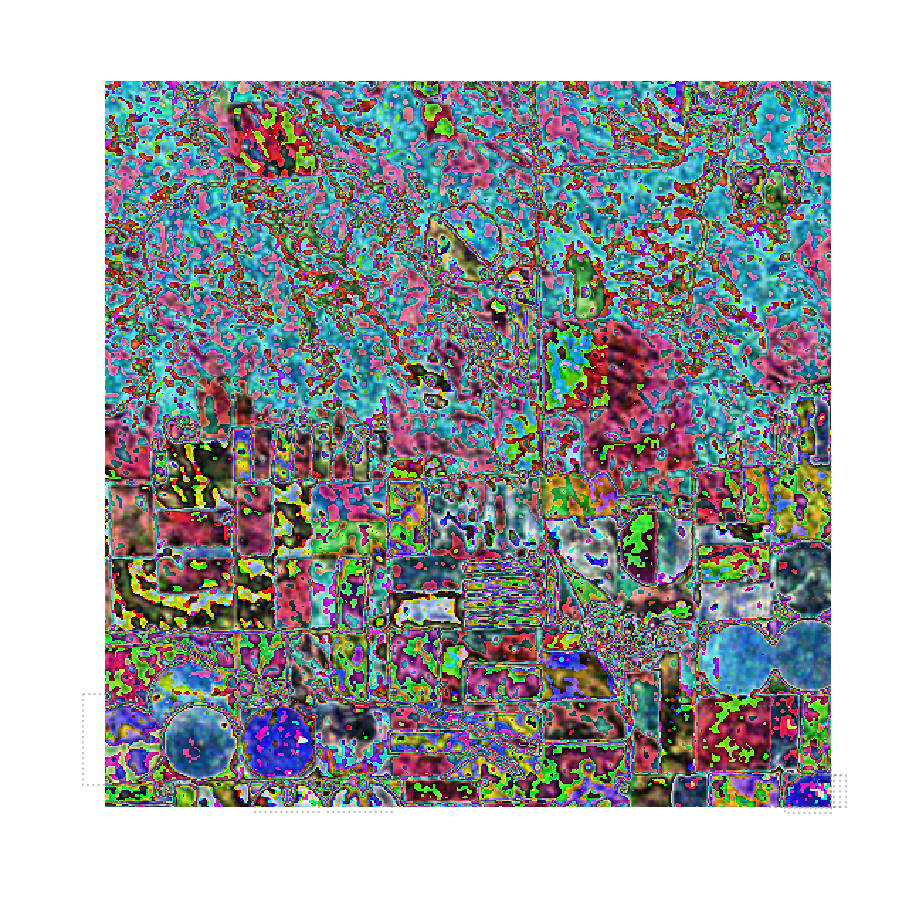

In [47]:
b = 0

# Restore original image (reverse normalization)
sample_image = modellib.unmold_image(normalized_images[b], config)

# Compute anchor shifts.
indices = np.where(rpn_match[b] == 1)[0]
refined_anchors = utils.apply_box_deltas(anchors[indices], rpn_bbox[b, :len(indices)] * config.RPN_BBOX_STD_DEV)
log("anchors", anchors)
log("refined_anchors", refined_anchors)

# Get list of positive anchors
positive_anchor_ids = np.where(rpn_match[b] == 1)[0]
print("Positive anchors: {}".format(len(positive_anchor_ids)))
negative_anchor_ids = np.where(rpn_match[b] == -1)[0]
print("Negative anchors: {}".format(len(negative_anchor_ids)))
neutral_anchor_ids = np.where(rpn_match[b] == 0)[0]
print("Neutral anchors: {}".format(len(neutral_anchor_ids)))

# ROI breakdown by class
for c, n in zip(dataset.class_names, np.bincount(mrcnn_class_ids[b].flatten())):
    if n:
        print("{:23}: {}".format(c[:20], n))

# Show positive anchors
fig, ax = plt.subplots(1, figsize=(16, 16))
img = visualize.draw_boxes(sample_image, boxes=anchors[positive_anchor_ids], 
                     refined_boxes=refined_anchors, ax=ax)

/opt/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


array([[[0.20165226, 0.76994498, 0.788277  ],
        [0.15554173, 0.69451189, 0.75600513],
        [0.13444349, 0.65098955, 0.70759734],
        ...,
        [0.39788542, 0.92584875, 0.9335004 ],
        [0.47440184, 0.        , 0.9335004 ],
        [0.66831441, 0.13520812, 0.96577226]],

       [[0.38161825, 0.84978908, 0.99535481],
        [0.3519319 , 0.80332281, 0.90660718],
        [0.36159954, 0.76793304, 0.83130615],
        ...,
        [0.29628328, 0.72986857, 0.78045352],
        [0.2842583 , 0.69836298, 0.71590979],
        [0.4428506 , 0.7535603 , 0.71070379]],

       [[0.52375335, 0.92812175, 0.07317142],
        [0.52375335, 0.92812175, 0.01155338],
        [0.59447275, 0.97384023, 0.97384023],
        ...,
        [0.15792096, 0.58705402, 0.67288063],
        [0.13628355, 0.52851425, 0.61493796],
        [0.23771043, 0.52494386, 0.60418067]],

       ...,

       [[0.01768041, 0.02357388, 0.45969073],
        [0.04759439, 0.00634592, 0.54574904],
        [0.06611083, 0

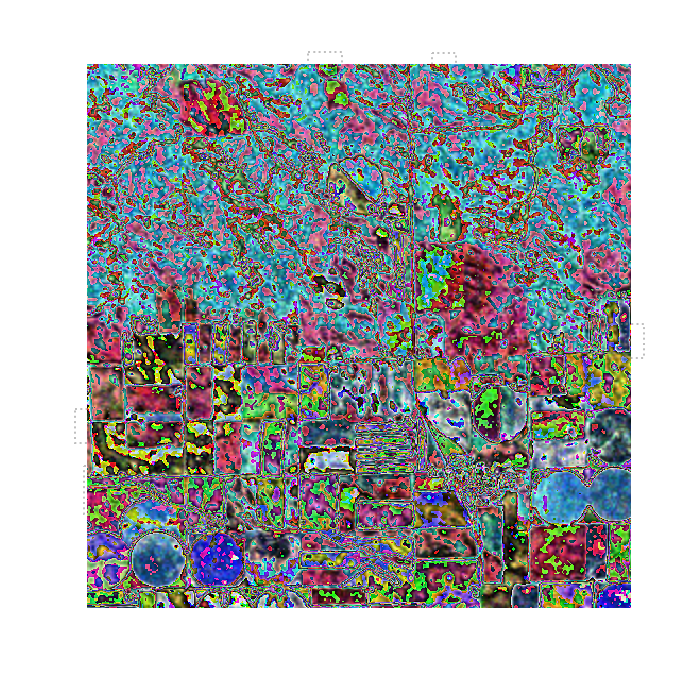

In [48]:
# Show negative anchors
visualize.draw_boxes(sample_image, boxes=anchors[negative_anchor_ids])

/opt/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


array([[[0.20165226, 0.76994498, 0.788277  ],
        [0.15554173, 0.69451189, 0.75600513],
        [0.13444349, 0.65098955, 0.70759734],
        ...,
        [0.39788542, 0.92584875, 0.9335004 ],
        [0.47440184, 0.        , 0.9335004 ],
        [0.66831441, 0.13520812, 0.96577226]],

       [[0.38161825, 0.84978908, 0.99535481],
        [0.3519319 , 0.80332281, 0.90660718],
        [0.36159954, 0.76793304, 0.83130615],
        ...,
        [0.29628328, 0.72986857, 0.78045352],
        [0.2842583 , 0.69836298, 0.71590979],
        [0.4428506 , 0.7535603 , 0.71070379]],

       [[0.52375335, 0.92812175, 0.07317142],
        [0.52375335, 0.92812175, 0.01155338],
        [0.59447275, 0.97384023, 0.97384023],
        ...,
        [0.15792096, 0.58705402, 0.67288063],
        [0.13628355, 0.52851425, 0.61493796],
        [0.23771043, 0.52494386, 0.60418067]],

       ...,

       [[0.01768041, 0.02357388, 0.45969073],
        [0.04759439, 0.00634592, 0.54574904],
        [0.06611083, 0

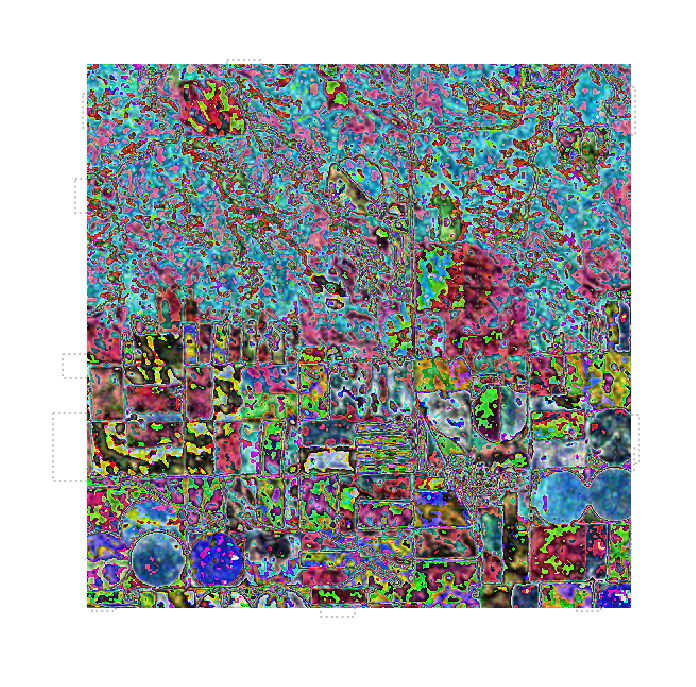

In [49]:
# Show neutral anchors. They don't contribute to training.
visualize.draw_boxes(sample_image, boxes=anchors[np.random.choice(neutral_anchor_ids, 100)])

## ROIs

Typically, the RPN network generates region proposals (a.k.a. Regions of Interest, or ROIs). The data generator has the ability to generate proposals as well for illustration and testing purposes. These are controlled by the `random_rois` parameter.

Positive ROIs:  27
Negative ROIs:  173
Positive Ratio: 0.14
Unique ROIs: 200 out of 200


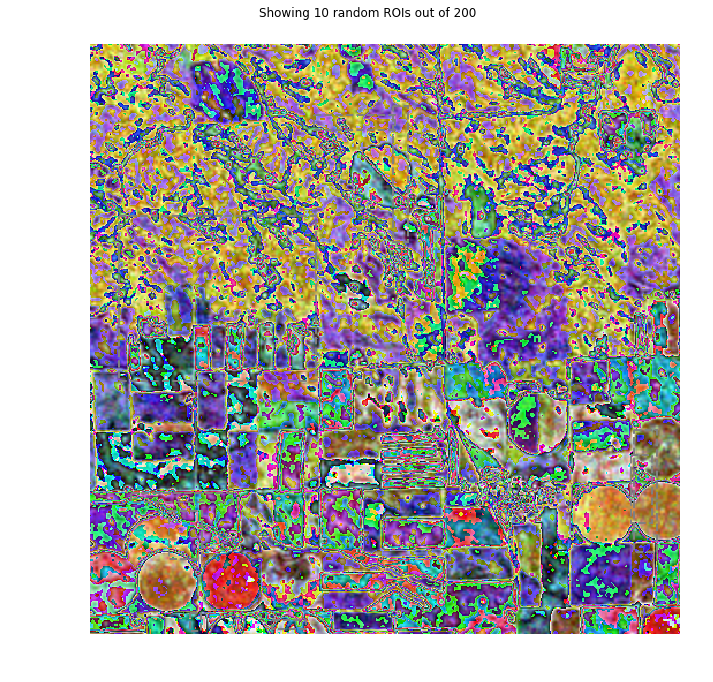

In [50]:
if random_rois:
    # Class aware bboxes
    bbox_specific = mrcnn_bbox[b, np.arange(mrcnn_bbox.shape[1]), mrcnn_class_ids[b], :]

    # Refined ROIs
    refined_rois = utils.apply_box_deltas(rois[b].astype(np.float32), bbox_specific[:,:4] * config.BBOX_STD_DEV)

    # Class aware masks
    mask_specific = mrcnn_mask[b, np.arange(mrcnn_mask.shape[1]), :, :, mrcnn_class_ids[b]]

    visualize.draw_rois(sample_image, rois[b], refined_rois, mask_specific, mrcnn_class_ids[b], dataset.class_names)
    
    # Any repeated ROIs?
    rows = np.ascontiguousarray(rois[b]).view(np.dtype((np.void, rois.dtype.itemsize * rois.shape[-1])))
    _, idx = np.unique(rows, return_index=True)
    print("Unique ROIs: {} out of {}".format(len(idx), rois.shape[1]))

<Figure size 1008x1224 with 0 Axes>

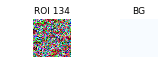

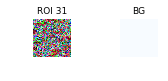

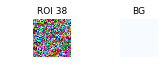

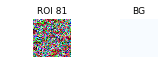

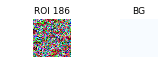

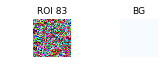

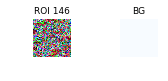

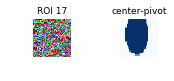

In [32]:
if random_rois:
    # Dispalay ROIs and corresponding masks and bounding boxes
    ids = random.sample(range(rois.shape[1]), 8)

    images = []
    titles = []
    for i in ids:
        image = visualize.draw_box(sample_image.copy(), rois[b,i,:4].astype(np.int32), [255, 0, 0])
        image = visualize.draw_box(image, refined_rois[i].astype(np.int64), [0, 255, 0])
        images.append(image)
        titles.append("ROI {}".format(i))
        images.append(mask_specific[i] * 255)
        titles.append(dataset.class_names[mrcnn_class_ids[b,i]][:20])

    display_images(images, titles, cols=4, cmap="Blues", interpolation="none")

In [33]:
# Check ratio of positive ROIs in a set of images.
if random_rois:
    limit = 10
    temp_g = modellib.data_generator(
        dataset, crop_config, shuffle=True, random_rois=10000, 
        batch_size=1, detection_targets=True)
    total = 0
    for i in range(limit):
        _, [ids, _, _] = next(temp_g)
        positive_rois = np.sum(ids[0] > 0)
        total += positive_rois
        print("{:5} {:5.2f}".format(positive_rois, positive_rois/ids.shape[1]))
    print("Average percent: {:.2f}".format(total/(limit*ids.shape[1])))

   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
Average percent: 0.33
